In [47]:
# Packages

import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")
from datetime import datetime
import plotly as px
import seaborn as sns
import matplotlib.pyplot as plt
# Example usage with different models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
#Encoding packages

from sklearn.preprocessing import LabelEncoder,OrdinalEncoder

In [48]:
df_1= pd.read_csv(r"https://raw.githubusercontent.com/GuviMentor88/Training-Datasets/main/insurance_dataset.csv")
df_1

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,Outcome
0,58,management,married,tertiary,unknown,5,may,261,1,unknown,no
1,44,technician,single,secondary,unknown,5,may,151,1,unknown,no
2,33,entrepreneur,married,secondary,unknown,5,may,76,1,unknown,no
3,47,blue-collar,married,unknown,unknown,5,may,92,1,unknown,no
4,33,unknown,single,unknown,unknown,5,may,198,1,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,cellular,17,nov,977,3,unknown,yes
45207,71,retired,divorced,primary,cellular,17,nov,456,2,unknown,yes
45208,72,retired,married,secondary,cellular,17,nov,1127,5,success,yes
45209,57,blue-collar,married,secondary,telephone,17,nov,508,4,unknown,no


In [49]:
print(df_1.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             45211 non-null  int64 
 1   job             45211 non-null  object
 2   marital         45211 non-null  object
 3   education_qual  45211 non-null  object
 4   call_type       45211 non-null  object
 5   day             45211 non-null  int64 
 6   mon             45211 non-null  object
 7   dur             45211 non-null  int64 
 8   num_calls       45211 non-null  int64 
 9   prev_outcome    45211 non-null  object
 10  Outcome         45211 non-null  object
dtypes: int64(4), object(7)
memory usage: 3.8+ MB
None


In [50]:
df_1.drop_duplicates().shape

(45205, 11)

In [51]:
df_1.isna().sum()

age               0
job               0
marital           0
education_qual    0
call_type         0
day               0
mon               0
dur               0
num_calls         0
prev_outcome      0
Outcome           0
dtype: int64

In [52]:
df_1.dtypes

age                int64
job               object
marital           object
education_qual    object
call_type         object
day                int64
mon               object
dur                int64
num_calls          int64
prev_outcome      object
Outcome           object
dtype: object

In [53]:
df_1.groupby('age').size()
df_1.groupby('job').size()
df_1.groupby('marital').size()
df_1.groupby('education_qual').size()
df_1.groupby('call_type').size()
df_1.groupby('prev_outcome').size()
df_1.groupby('Outcome').size()

Outcome
no     39922
yes     5289
dtype: int64

In [54]:
columns = ['age', 'job', 'marital', 'education_qual', 'call_type', 'prev_outcome', 'Outcome']
{col: df_1[col].value_counts() for col in columns}

{'age': age
 32    2085
 31    1996
 33    1972
 34    1930
 35    1894
       ... 
 95       2
 93       2
 92       2
 88       2
 94       1
 Name: count, Length: 77, dtype: int64,
 'job': job
 blue-collar      9732
 management       9458
 technician       7597
 admin.           5171
 services         4154
 retired          2264
 self-employed    1579
 entrepreneur     1487
 unemployed       1303
 housemaid        1240
 student           938
 unknown           288
 Name: count, dtype: int64,
 'marital': marital
 married     27214
 single      12790
 divorced     5207
 Name: count, dtype: int64,
 'education_qual': education_qual
 secondary    23202
 tertiary     13301
 primary       6851
 unknown       1857
 Name: count, dtype: int64,
 'call_type': call_type
 cellular     29285
 unknown      13020
 telephone     2906
 Name: count, dtype: int64,
 'prev_outcome': prev_outcome
 unknown    36959
 failure     4901
 other       1840
 success     1511
 Name: count, dtype: int64,
 'Outcome':

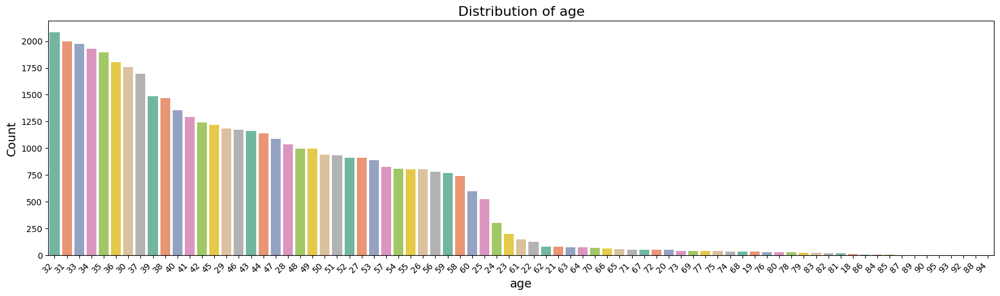

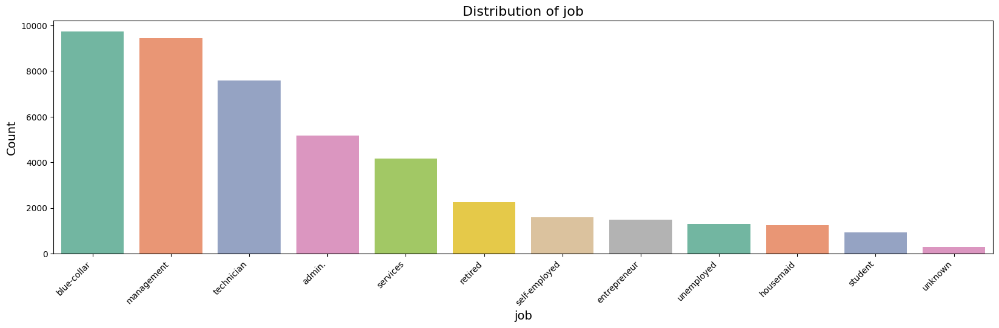

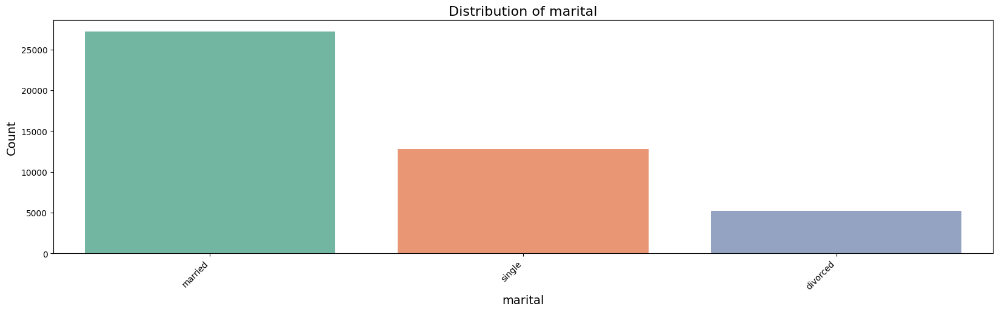

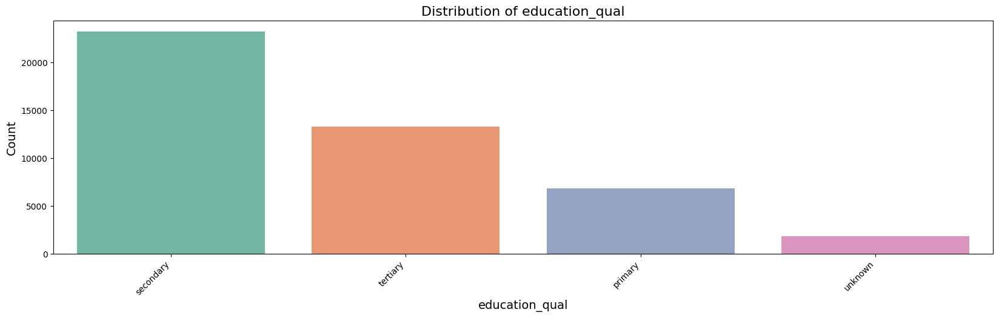

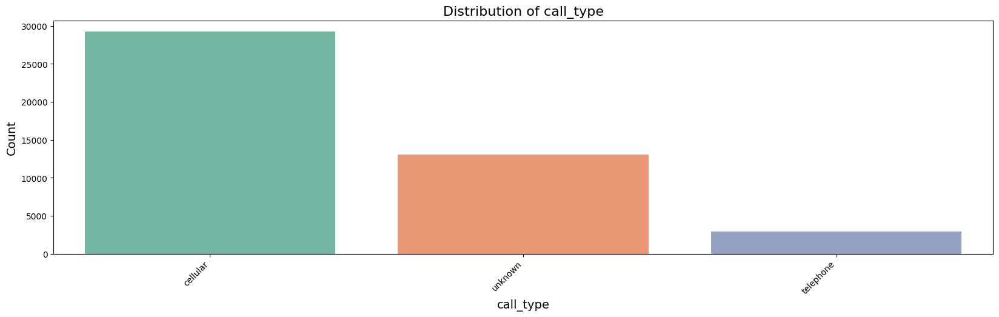

...

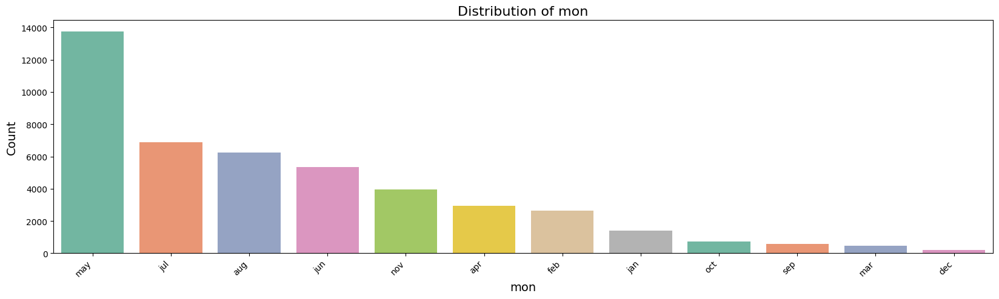

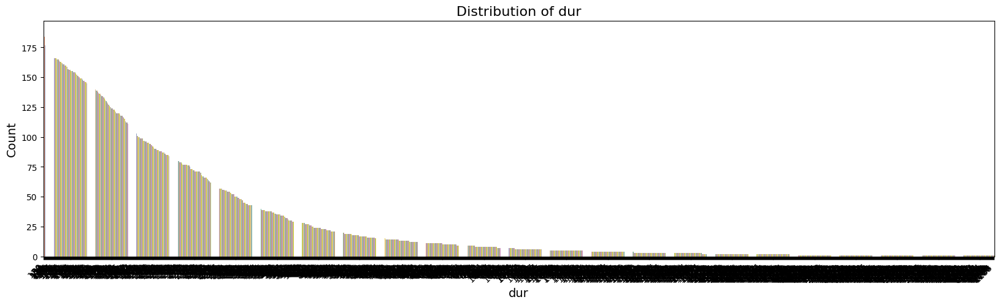

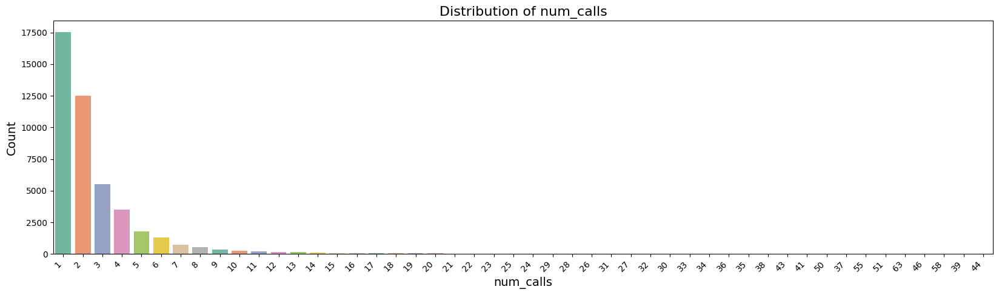

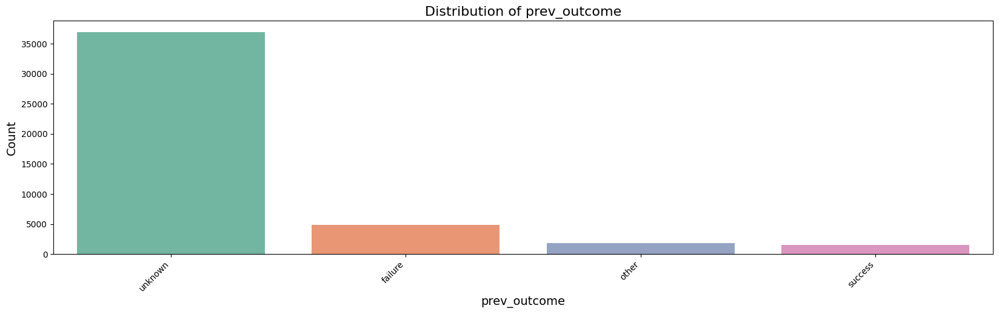

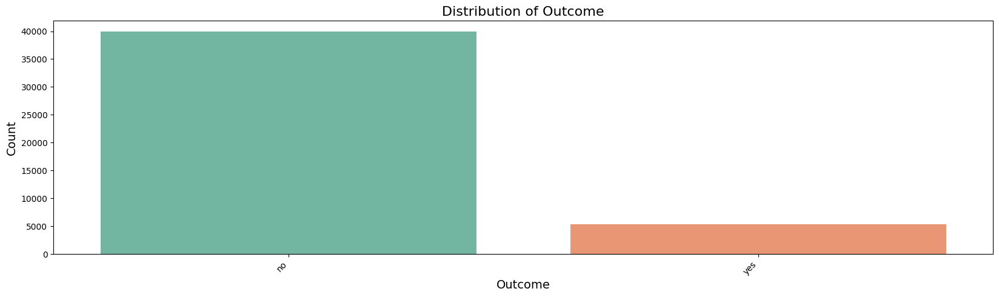

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

for col in df_1.columns:
    plt.figure(figsize=(20, 5))
    
    # Plot the countplot with the "Set2" color palette
    sns.countplot(data=df_1, x=col, order=df_1[col].value_counts().index, 
                  palette=sns.color_palette("Set2", len(df_1[col].unique())))
    
    # Customize the plot with title and labels
    plt.title(f'Distribution of {col}', fontsize=16)
    plt.xlabel(col, fontsize=14)
    plt.ylabel('Count', fontsize=14)
    
    # Rotate x-axis labels if they are too long
    plt.xticks(rotation=45, ha='right')
    plt.show()

##Outlier

In [57]:
import seaborn as sns
import matplotlib.pyplot as plt

def Outl(df, column):
    # Set the figure size for better visibility
    plt.figure(figsize=(8, 5))
    
    # Create a boxplot for the specified column with a color palette
    sns.boxplot(y=df[column], color='skyblue')
    
    # Add a title and labels for better readability
    plt.title(f'Boxplot for {column}', fontsize=14)
    plt.ylabel(column, fontsize=12)
    
    # Display the plot
    plt.show()

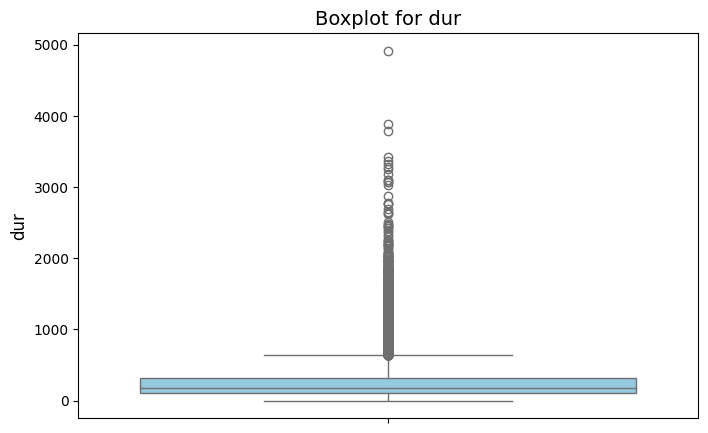

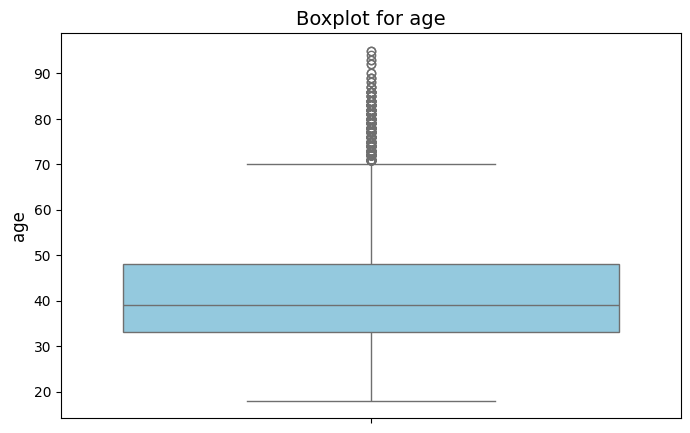

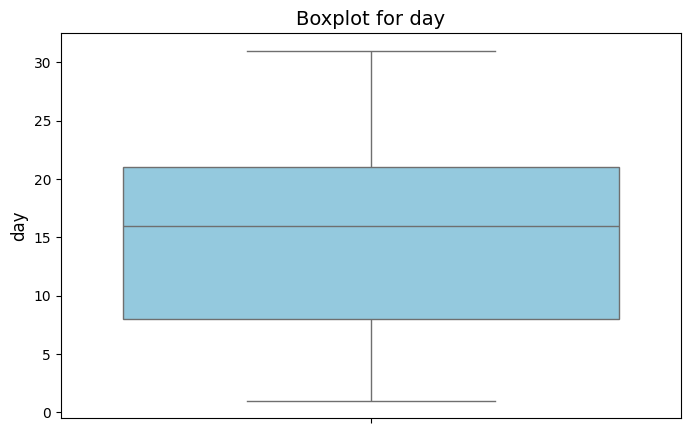

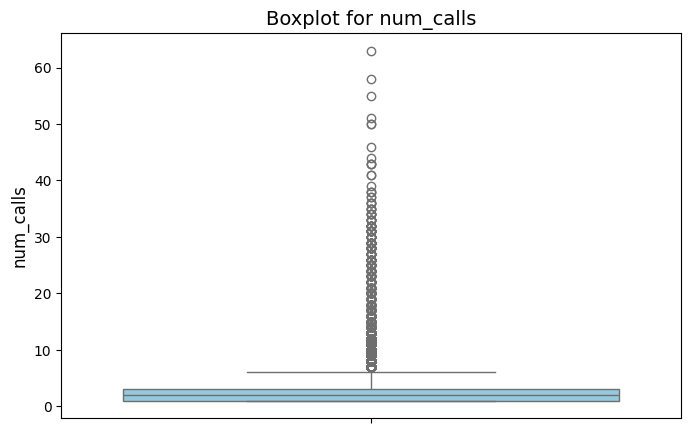

In [11]:
Outl(df_1, "dur")
Outl(df_1, 'age')
Outl(df_1, 'day')
Outl(df_1, 'num_calls')

In [58]:
def outlier(df,column):
  q1= df[column].quantile(0.25)
  q3= df[column].quantile(0.75)

  iqr= q3-q1

  upper_threshold= q3 + (1.5*iqr)
  lower_threshold= q1 - (1.5*iqr)

  df[column]= df[column].clip(lower_threshold, upper_threshold)

In [59]:
outlier_columns=["dur","age","num_calls"]
for j in outlier_columns:
    outlier(df_1,j)

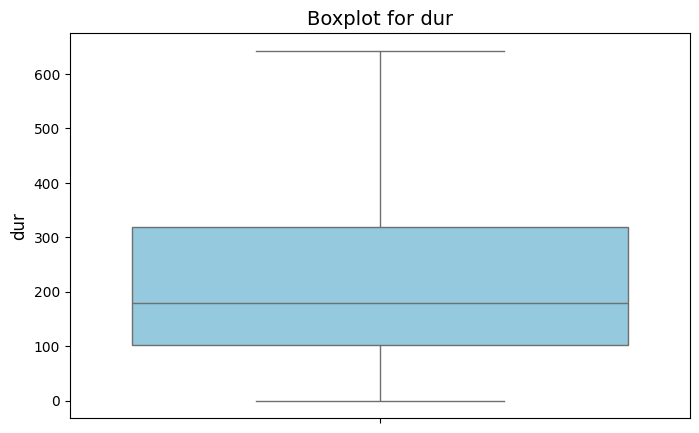

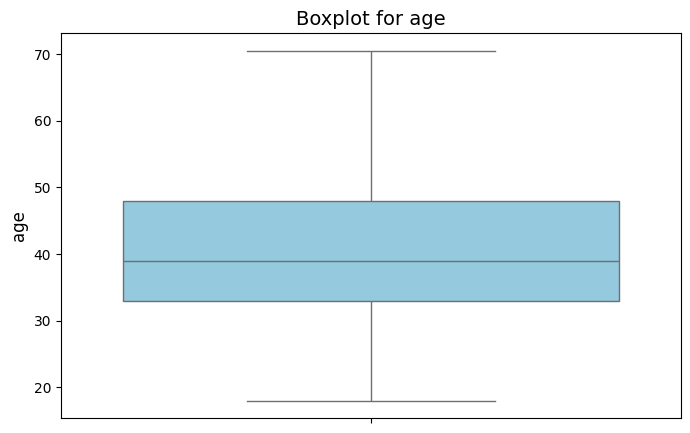

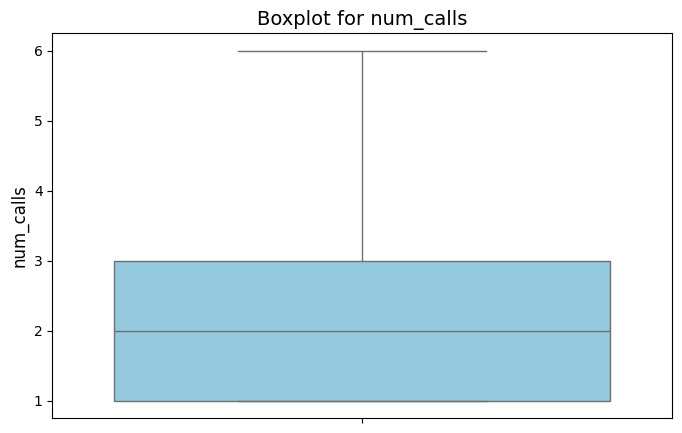

In [60]:
for k in outlier_columns:
    Outl(df_1,k)

In [61]:
df_1.Outcome = df_1.Outcome.map({'no':0,'yes':1})

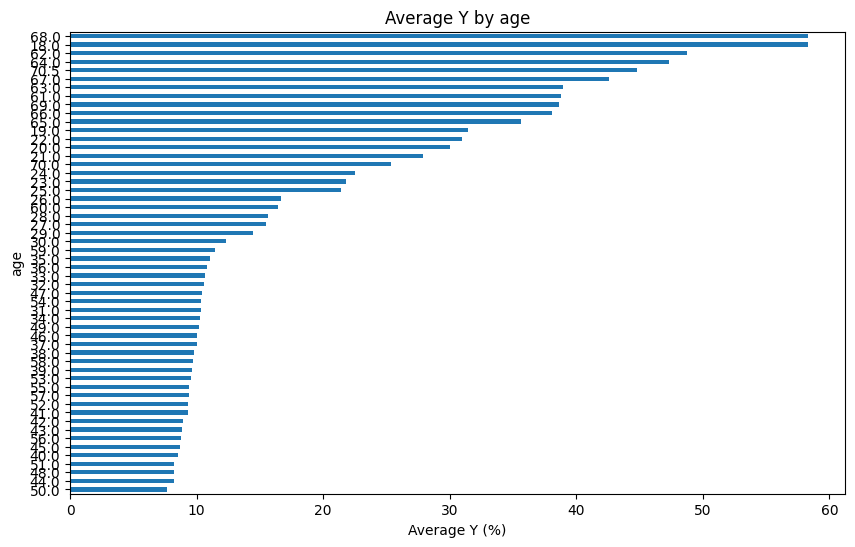

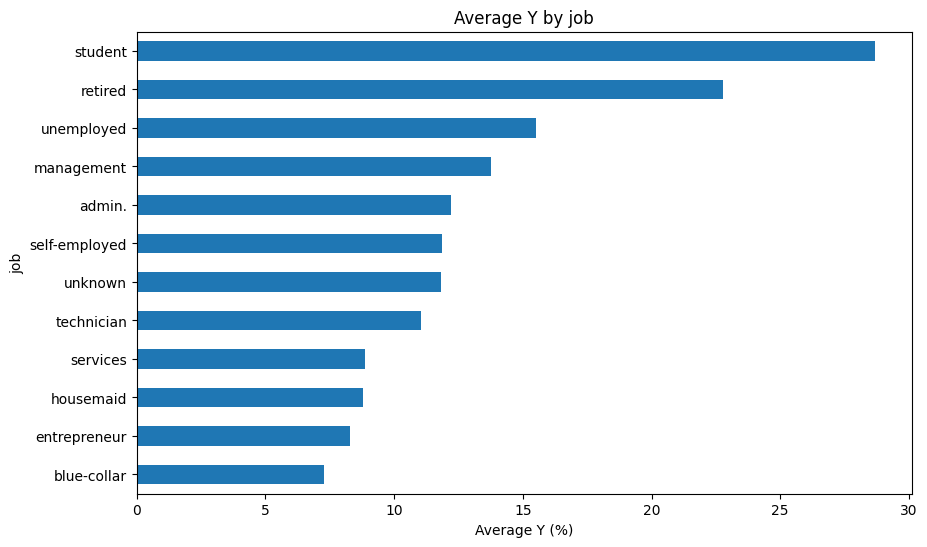

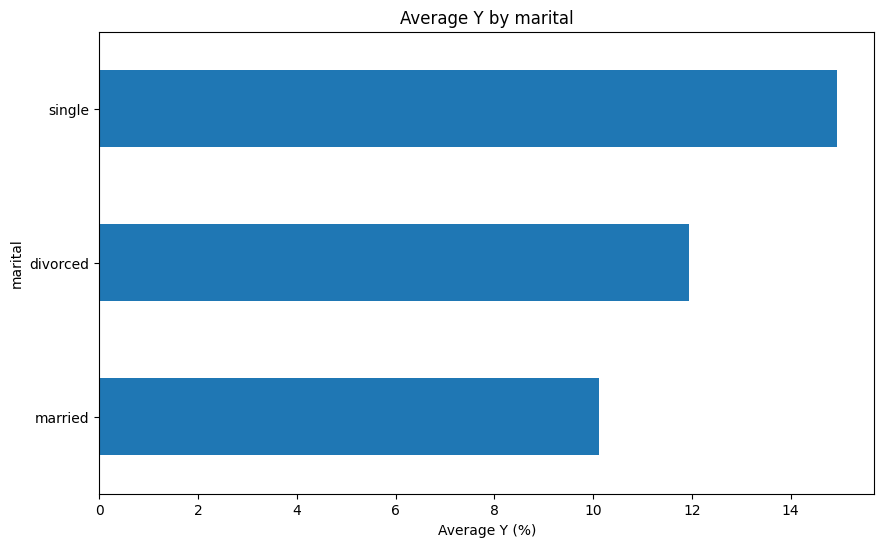

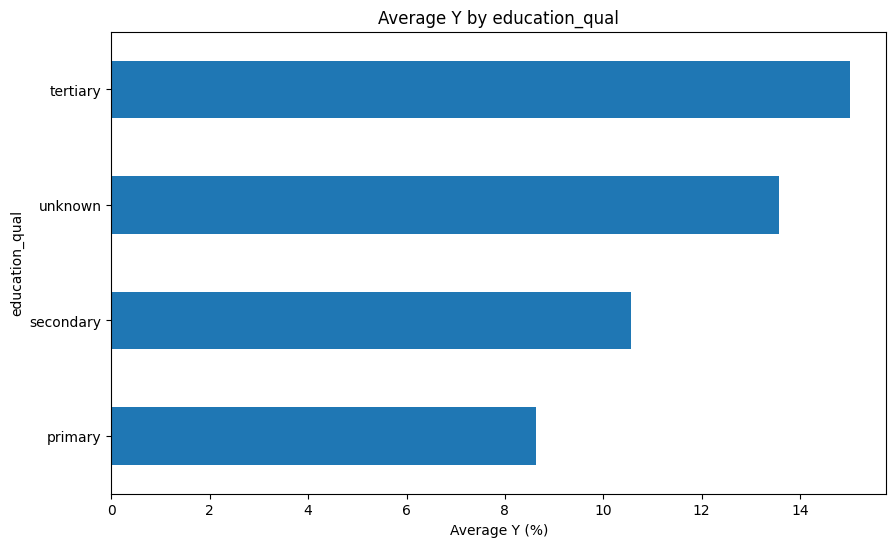

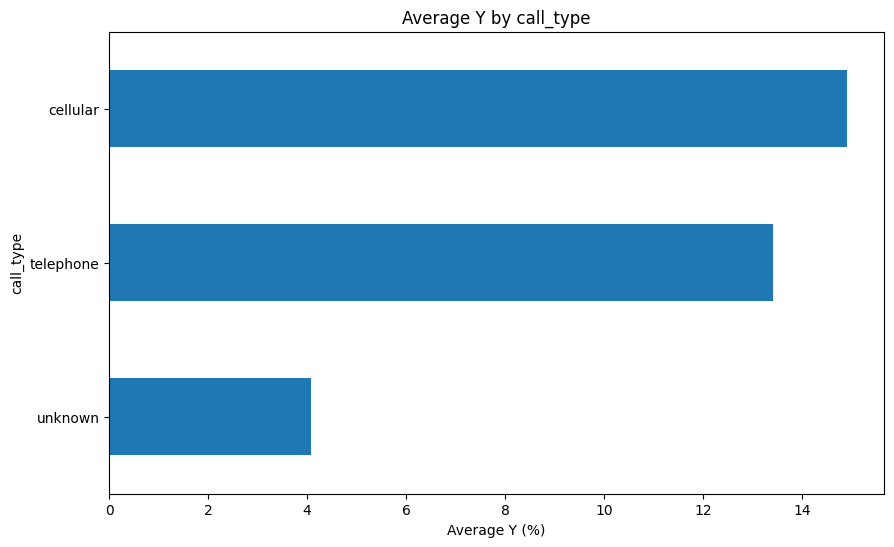

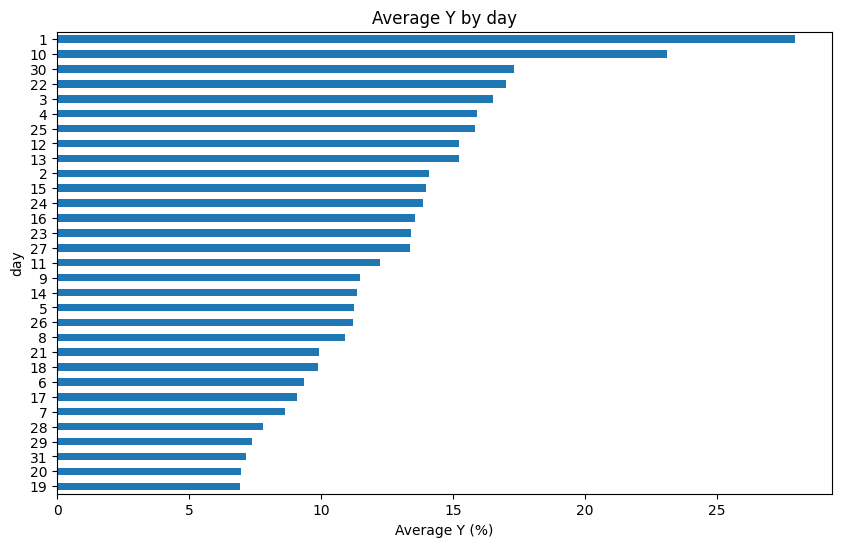

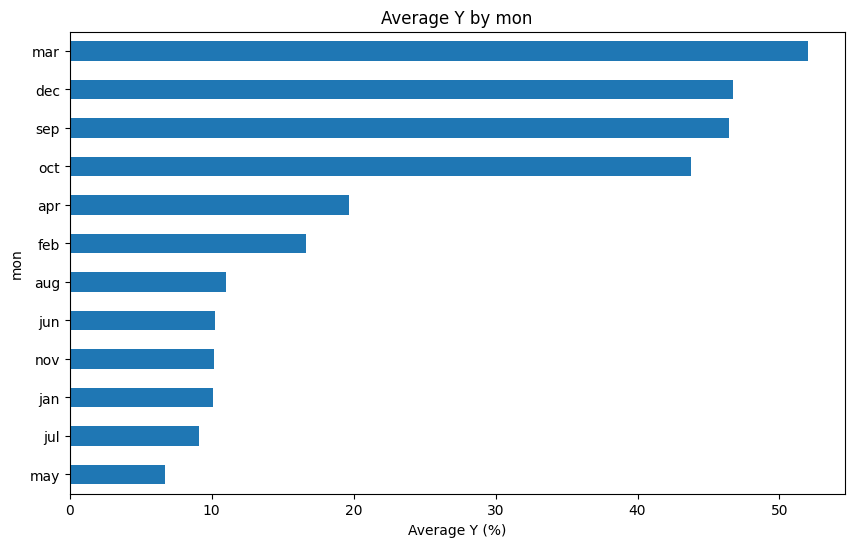

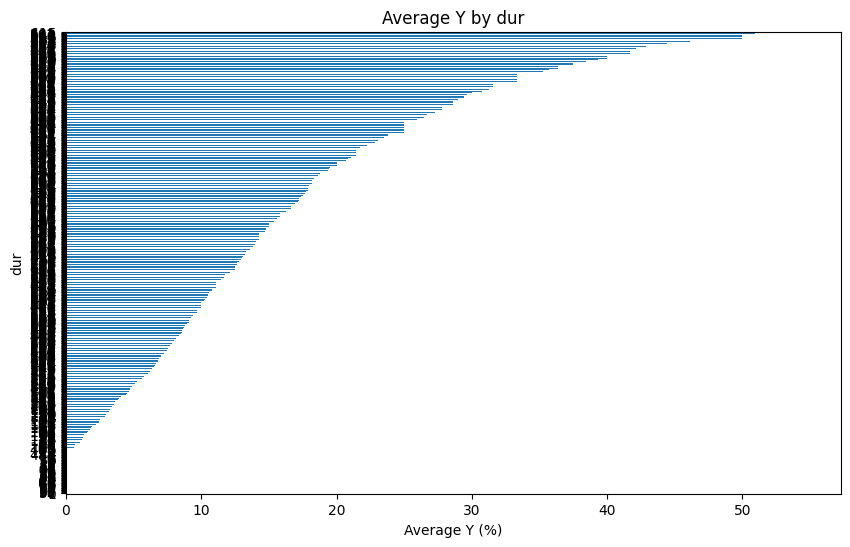

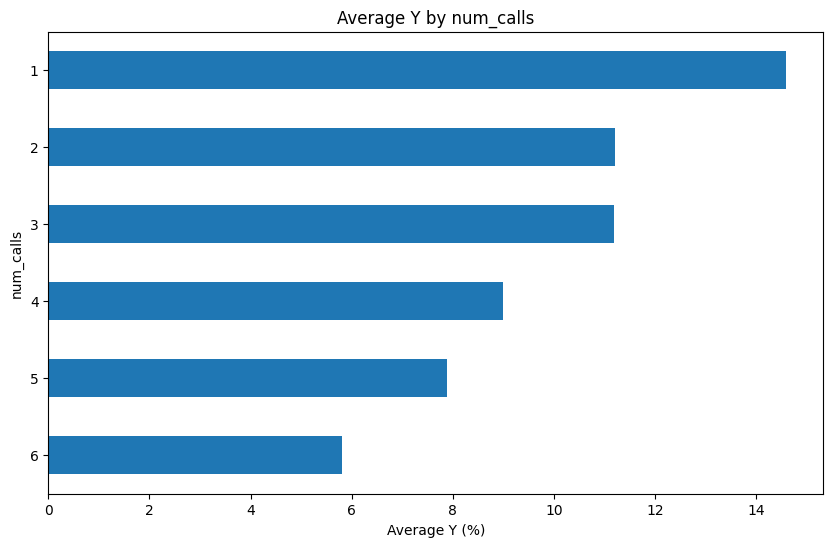

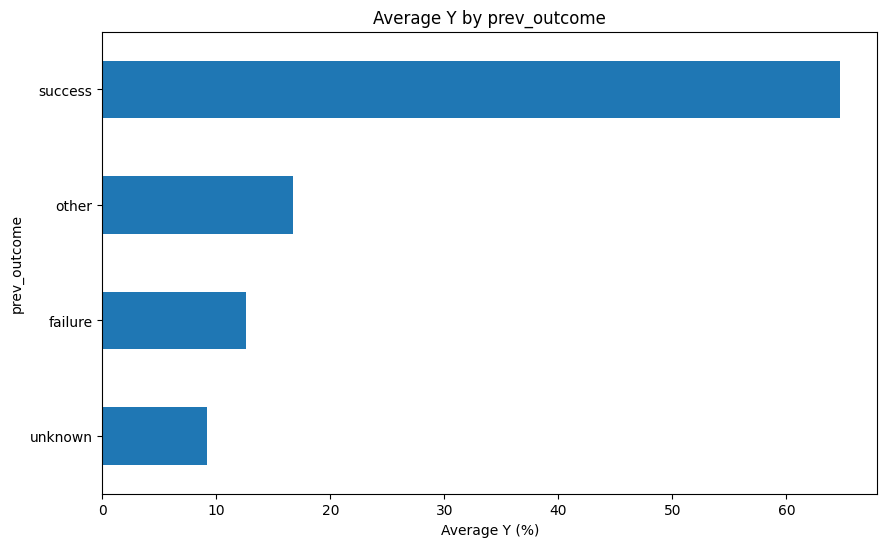

In [86]:
import seaborn as sns
import matplotlib.pyplot as plt

def barplot(df):
    for col in df.columns:
        if col != "Outcome":  # Avoid plotting "y" against itself
            plt.figure(figsize=(10, 6))  # Adjust figure size as needed
            (df.groupby(col)['Outcome'].mean() * 100).sort_values().plot(kind='barh')
            plt.title(f"Average Y by {col}")
            plt.xlabel("Average Y (%)")
            plt.ylabel(col)
            plt.show()

# Assuming your DataFrame is named 'data' (replace with your actual name)
barplot(df_1)

In [16]:
# Analysis:

# People aged 85-95 have subscribed more to the insurance.
# Students have subscribed more to the insurance.
# Singles have subscribed more to the insurance.
# People with tertiary education have purchased more insurance.
# Cellular calls have resulted in more conversions.
# More people have purchased the insurance on the 1st day of the month.
# The highest conversion rate is observed in the month of March.
# Most customers have purchased it after just one call.
# The minimum duration of the call should be 200 seconds.
# If the previous outcome of the call was successful, the customer is more likely to convert.
# Inference (What the Company Must Do)

# The insurance company should target more elderly individuals.
# The company must engage more with students than with blue-collar or management workers.
# The company should focus more on singles.
# The company should try to make more calls on the 1st day of the month.
# The company should put in more effort during the month of March than in May.

In [62]:
col = df_1[["age", "day", "dur","Outcome","num_calls"]]  # Select the columns "age", "day", and "dur"

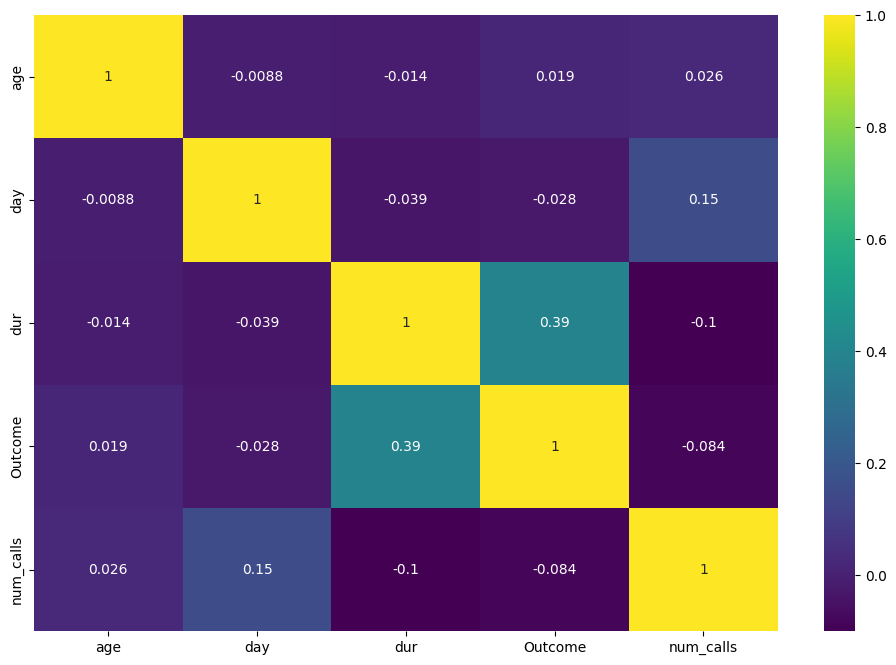

In [63]:
df_heatmap = col.corr()
# Create a heatmap with a new color palette
plt.figure(figsize=(12, 8))  # Set the figure size
sns.heatmap(df_heatmap, annot=True, cmap='viridis')  # Change the color palette
plt.show()

In [64]:
df_1.mon = df_1.mon.map({'jan': 2, 'feb': 6, 'mar': 11, 'apr': 7, 'may': 0, 'jun': 4, 'jul': 1, 'aug': 5, 'sep': 9, 'oct': 8, 'nov': 3, 'dec': 10})
df_1.education_qual = df_1.education_qual.map({'tertiary':3, 'secondary':1, 'unknown':2, 'primary':0})
df_1.marital = df_1.marital.map({'married':0, 'single':2, 'divorced':1})
df_1.call_type = df_1.call_type.map({'unknown':0, 'cellular':2, 'telephone':1})
df_1.prev_outcome = df_1.prev_outcome.map({'unknown':0, 'failure':1, 'other':2, 'success':3})
df_1.job = df_1.job.map({'management': 8,'technician': 4,'entrepreneur': 1,'blue-collar': 0,'unknown': 5,'retired': 10,'admin.': 7, 'services': 3,
                         'self-employed': 6,'unemployed': 9,'housemaid': 2,'student': 11})

In [65]:
df_1.head(10)

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,Outcome
0,58.0,8,0,3,0,5,0,261,1,0,0
1,44.0,4,2,1,0,5,0,151,1,0,0
2,33.0,1,0,1,0,5,0,76,1,0,0
3,47.0,0,0,2,0,5,0,92,1,0,0
4,33.0,5,2,2,0,5,0,198,1,0,0
5,35.0,8,0,3,0,5,0,139,1,0,0
6,28.0,8,2,3,0,5,0,217,1,0,0
7,42.0,1,1,3,0,5,0,380,1,0,0
8,58.0,10,0,0,0,5,0,50,1,0,0
9,43.0,4,2,1,0,5,0,55,1,0,0


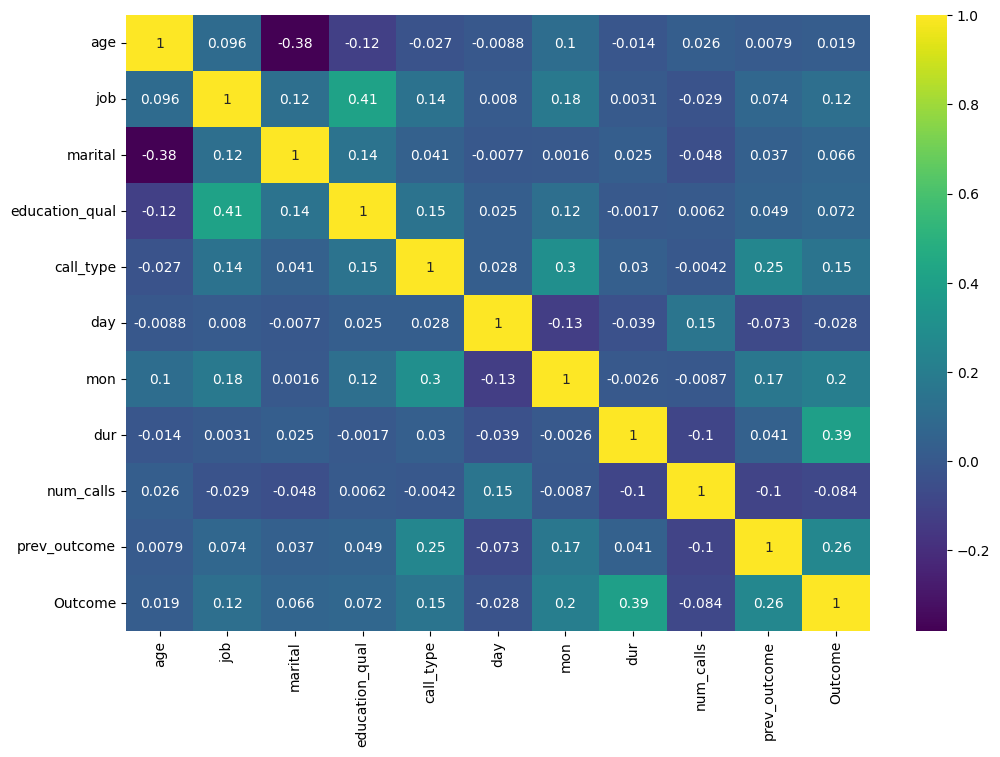

In [66]:
col = df_1.columns  # If you want to analyze all columns
df_heatmap = df_1[col].corr() 
plt.figure(figsize=(12, 8))  # Set the figure size
sns.heatmap(df_heatmap, annot=True, cmap='viridis')  # Generate the heatmap with annotations
plt.show()

In [67]:
from sklearn.model_selection import train_test_split

X = df_1.drop(columns="Outcome")
y = df_1.loc[:, "Outcome"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 8)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((36168, 10), (9043, 10), (36168,), (9043,))

In [68]:
y_train.value_counts()

Outcome
0    31947
1     4221
Name: count, dtype: int64

In [69]:
from imblearn.over_sampling import SMOTE
from collections import Counter

In [70]:
# Checking the class distribution before applying SMOTE
print("Before SMOTE:", Counter(y_train))

# Apply SMOTE
smote = SMOTE(random_state=42)  # You can set the random_state for reproducibility
X_res, y_res = smote.fit_resample(X_train, y_train)

# Checking the class distribution after applying SMOTE
print("After SMOTE:", Counter(y_res))

Before SMOTE: Counter({0: 31947, 1: 4221})
After SMOTE: Counter({1: 31947, 0: 31947})


Balancing the data


In [71]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix

In [72]:
def select_model_categorical_pre_split(X_res, X_test, y_res, y_test, algorithm, **kwargs):
    # Train the model with additional parameters
    model = algorithm(**kwargs).fit(X_res, y_res)

    # Predictions
    y_pred_train = model.predict(X_res)
    y_pred_test = model.predict(X_test)

    # Classification Metrics
    train_accuracy = accuracy_score(y_res, y_pred_train)
    train_precision = precision_score(y_res, y_pred_train, average="weighted")  # Use "weighted" for multiclass
    train_recall = recall_score(y_res, y_pred_train, average="weighted")
    train_f1 = f1_score(y_res, y_pred_train, average="weighted")

    test_accuracy = accuracy_score(y_test, y_pred_test)
    test_precision = precision_score(y_test, y_pred_test, average="weighted")
    test_recall = recall_score(y_test, y_pred_test, average="weighted")
    test_f1 = f1_score(y_test, y_pred_test, average="weighted")

    metrics_train = {
        "Data": "Train Data",
        "Model": algorithm.__name__,
        "Accuracy": train_accuracy,
        "Precision": train_precision,
        "Recall": train_recall,
        "F1_score": train_f1,
    }

    metrics_test = {
        "Data": "Test Data",
        "Model": algorithm.__name__,
        "Accuracy": test_accuracy,
        "Precision": test_precision,
        "Recall": test_recall,
        "F1_score": test_f1,
    }

    print(metrics_train)
    print(metrics_test)
    print("")
    print("Classification Report (Test Data):")
    print(classification_report(y_test, y_pred_test))
    print("Confusion Matrix (Test Data):")
    print(confusion_matrix(y_test, y_pred_test))


In [32]:
models = [
    LogisticRegression,
    RandomForestClassifier,
    GradientBoostingClassifier,
    XGBClassifier,
    LGBMClassifier
]

# Iterate through the models and evaluate each
for model in models:
    print(f"Evaluating model: {model.__name__}")
    select_model_categorical_pre_split(X_res, X_test, y_res, y_test, model)   
    print("-" * 50)

Evaluating model: LogisticRegression
{'Data': 'Train Data', 'Model': 'LogisticRegression', 'Accuracy': 0.7981500610385952, 'Precision': np.float64(0.7986622613922565), 'Recall': np.float64(0.7981500610385952), 'F1_score': np.float64(0.7980634816733098)}
{'Data': 'Test Data', 'Model': 'LogisticRegression', 'Accuracy': 0.7725312396328652, 'Precision': np.float64(0.8899923514883502), 'Recall': np.float64(0.7725312396328652), 'F1_score': np.float64(0.8088530121968884)}

Classification Report (Test Data):
              precision    recall  f1-score   support

           0       0.97      0.77      0.86      7975
           1       0.32      0.80      0.45      1068

    accuracy                           0.77      9043
   macro avg       0.64      0.79      0.66      9043
weighted avg       0.89      0.77      0.81      9043

Confusion Matrix (Test Data):
[[6129 1846]
 [ 211  857]]
--------------------------------------------------
Evaluating model: RandomForestClassifier
{'Data': 'Train Da

In [75]:
from sklearn.model_selection import GridSearchCV
import lightgbm as lgb

param_grid = {
    'num_leaves': [31, 63, 127],
    'max_depth': [-1, 5, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 200, 300],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.7, 0.8, 1.0]
}

model = lgb.LGBMClassifier()
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, verbose=1)
grid_search.fit(X_res, y_res)

print(f"Best parameters: {grid_search.best_params_}")
print(f"Best score: {grid_search.best_score_}")

Fitting 5 folds for each of 729 candidates, totalling 3645 fits
[LightGBM] [Info] Number of positive: 25557, number of negative: 25558
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 585
[LightGBM] [Info] Number of data points in the train set: 51115, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.499990 -> initscore=-0.000039
[LightGBM] [Info] Start training from score -0.000039
[LightGBM] [Info] Number of positive: 25557, number of negative: 25558
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000906 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 586
[LightGBM] [Info] Number of data points in the tr

In [79]:
final_model = lgb.LGBMClassifier(
    colsample_bytree=1.0,
    learning_rate=0.1,
    max_depth=10,
    n_estimators=300,
    num_leaves=127,
    subsample=0.8
)
final_model.fit(X_res, y_res)

[LightGBM] [Info] Number of positive: 31947, number of negative: 31947
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000538 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 585
[LightGBM] [Info] Number of data points in the train set: 63894, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posi

LGBMClassifier(max_depth=10, n_estimators=300, num_leaves=127, subsample=0.8)

In [80]:
from sklearn.metrics import accuracy_score, classification_report

y_pred = final_model.predict(X_test)
print(f"Accuracy on test set: {accuracy_score(y_test, y_pred)}")
print(classification_report(y_test, y_pred))

Accuracy on test set: 0.8972686055512551
              precision    recall  f1-score   support

           0       0.95      0.94      0.94      7975
           1       0.56      0.59      0.58      1068

    accuracy                           0.90      9043
   macro avg       0.75      0.77      0.76      9043
weighted avg       0.90      0.90      0.90      9043



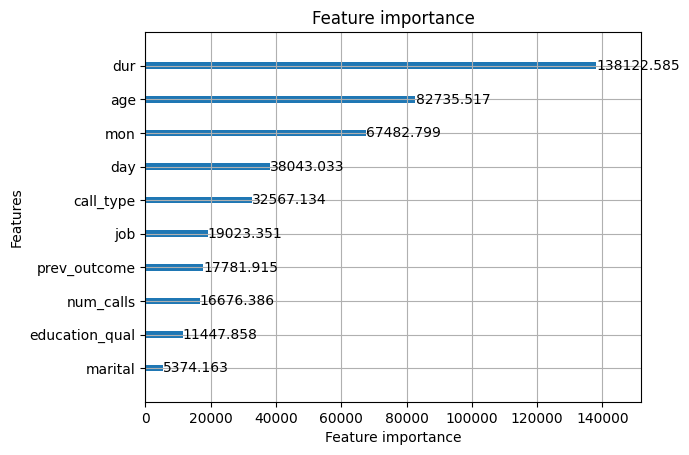

In [81]:
import matplotlib.pyplot as plt

lgb.plot_importance(final_model, max_num_features=10, importance_type='gain')
plt.show()

In [82]:
import pickle

# Save the model to a .pkl file
with open('lgbm_model.pkl', 'wb') as file:
    pickle.dump(grid_search.best_estimator_, file)

print("Model saved as lgbm_model.pkl")

Model saved as lgbm_model.pkl


In [83]:
# Load the model from the .pkl file
with open('lgbm_model.pkl', 'rb') as file:
    loaded_model = pickle.load(file)

print("Model loaded successfully")

Model loaded successfully


In [85]:
df_1.iloc[45206]

age                51.0
job                 4.0
marital             0.0
education_qual      3.0
call_type           2.0
day                17.0
mon                 3.0
dur               643.0
num_calls           3.0
prev_outcome        0.0
Outcome             1.0
Name: 45206, dtype: float64

In [88]:
user_data = np.array([[51,4,0,3,2,17,3,643,3,0]])
y_pred_1 = final_model.predict(user_data)
y_pred_1[0]

np.int64(1)

In [89]:
df_1.iloc[45209]

age                57.0
job                 0.0
marital             0.0
education_qual      1.0
call_type           1.0
day                17.0
mon                 3.0
dur               508.0
num_calls           4.0
prev_outcome        0.0
Outcome             0.0
Name: 45209, dtype: float64

In [90]:
user_data = np.array([[57,0,0,1,1,17,3,508,4,0]])
y_pred_1 = final_model.predict(user_data)
y_pred_1[0]

np.int64(0)

In [84]:
df_1.describe()

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,Outcome
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.868185,4.739488,0.680963,1.477937,1.359758,15.806419,2.856163,234.939307,2.392228,0.290062,0.116985
std,10.394895,3.384906,0.884908,1.068177,0.897951,8.322476,2.715320,176.749932,1.600111,0.698469,0.321406
min,18.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,33.000000,2.000000,0.000000,1.000000,0.000000,8.000000,0.000000,103.000000,1.000000,0.000000,0.000000
50%,39.000000,4.000000,0.000000,1.000000,2.000000,16.000000,3.000000,180.000000,2.000000,0.000000,0.000000
75%,48.000000,8.000000,2.000000,3.000000,2.000000,21.000000,5.000000,319.000000,3.000000,0.000000,0.000000
max,70.500000,11.000000,2.000000,3.000000,2.000000,31.000000,11.000000,643.000000,6.000000,3.000000,1.000000
